# Dimensionality reduction and clustering

In this step of the pipeline, we are employing dimensionality reduction techniques such as PCA and UMAP to look at interesting data points in the set, and then run clustering with Louvain's method.

In [1]:
import math
import random
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline

import os

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

BATCH_LABELS = ("control", "treated")

/home/ubuntu/.local/lib/python3.6/site-packages/numba/errors.py:105: UserWarning: Insufficiently recent colorama version found. Numba requires colorama >= 0.3.9
  warnings.warn(msg)


scanpy==1.4 anndata==0.6.19 numpy==1.17.0 scipy==1.2.1 pandas==0.25.0 scikit-learn==0.20.3 statsmodels==0.9.0 python-igraph==0.7.1 louvain==0.6.1 


## Load previous data
We will now load the data saved in the previous step.

In [2]:
batches = {}

for batch in BATCH_LABELS:
    filename = "tgfb1-3-" + batch + ".h5ad"
    filename = os.path.join("write", filename)
    batches[batch] = anndata.read(filename)

batches

{'control': AnnData object with n_obs × n_vars = 5347 × 4542 
     obs: 'batch', 'cellular_barcode', 'n_counts', 'percent_mito', 'S_score', 'G2M_score', 'phase'
     var: 'gene_names', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
     uns: 'genes_before_highly_variable', 'genes_original', 'pca', 'phase_colors'
     obsm: 'X_pca'
     varm: 'PCs'
     layers: 'ambiguous', 'spliced', 'unspliced',
 'treated': AnnData object with n_obs × n_vars = 7441 × 4542 
     obs: 'batch', 'cellular_barcode', 'n_counts', 'percent_mito', 'S_score', 'G2M_score', 'phase'
     var: 'gene_names', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
     uns: 'genes_before_highly_variable', 'genes_original', 'pca', 'phase_colors'
     obsm: 'X_pca'
     varm: 'PCs'
     layers: 'ambiguous', 'spliced', 'unspliced'}

## Confirm PCA tool data was saved
We will re-generate the old PCA plots for each batch as a confirmation that the data has been saved.

PCA plot for batch control


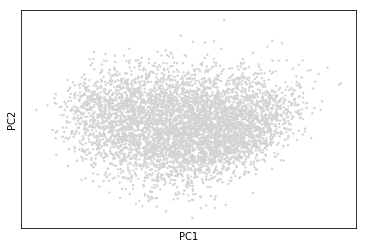

PCA plot for batch treated


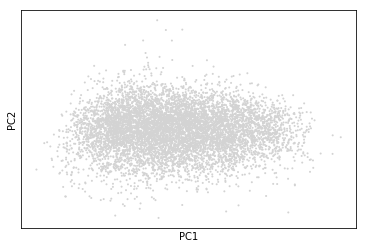

In [3]:
for batch, matrix in batches.items():
    print("PCA plot for batch", batch)
    sc.pl.pca(matrix)

## TGFB1-values in cells

We will check if TGFB1 is present in each of the batches. Then, we make a PCA-plot visualizing TGFB1-counts in the different batches.

TGFB1 present in batch control :  True
Printing TGFB1 PCA plot for batch control


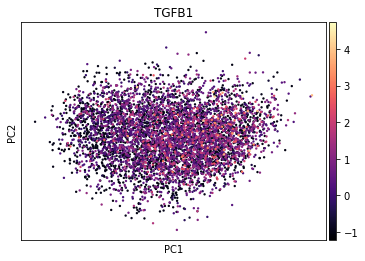

TGFB1 present in batch treated :  True
Printing TGFB1 PCA plot for batch treated


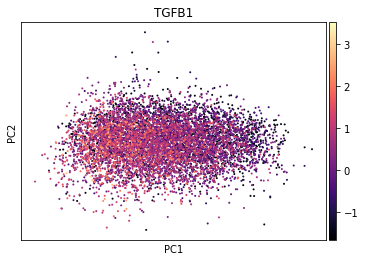

In [4]:
for batch, matrix in batches.items():
    present = any(matrix.var.gene_names == "TGFB1")
    print("TGFB1 present in batch", batch, ": ", present)
    
    if present:
        print("Printing TGFB1 PCA plot for batch", batch)
        sc.pl.pca(matrix, color="TGFB1", color_map=mpl.cm.magma)

Let's generate a variance ratio plot for each batch. This is useful because it provides insight into how much each PC contributes to the variance of the set. We can use this information as a cut-off for neighborhood graph calculations.

Printing PCA variance ratio for batch control


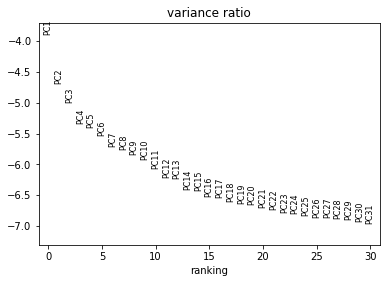

Printing PCA variance ratio for batch treated


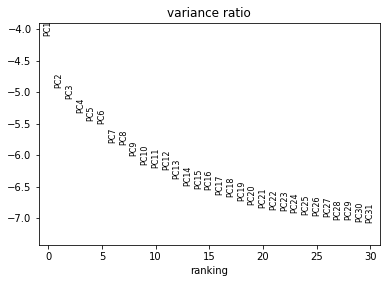

In [5]:
for batch, matrix in batches.items():
    print("Printing PCA variance ratio for batch", batch)
    sc.pl.pca_variance_ratio(matrix, log=True)

## Computing the neighborhood graph

We are computing the neighborhood graph on the cells per each batch, using the previously established principal components.

TODO: For the sake of reproducing Seurat's results, let's take the following values. more descriptive reason?

In [6]:
for batch, matrix in batches.items():
    print("Neighborhood graph calculation for batch", batch)
    sc.pp.neighbors(matrix, n_neighbors=10, n_pcs=40)

Neighborhood graph calculation for batch control
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished (0:00:04.13) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix
Neighborhood graph calculation for batch treated
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished (0:00:01.75) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix


## UMAP

We can use UMAP ([McInnes et al., 2018](https://arxiv.org/abs/1802.03426)) to get a two-dimensional representation of the neighborhood graph. This method is preferred over tSNE because (per the abstract) "\[it\] is competitive with t-SNE for visualization quality, and arguably preserves more of the global structure with superior run time performance."


In [7]:
for batch, matrix in batches.items():
    print("UMAP calculations for batch", batch)
    sc.tl.umap(matrix)

UMAP calculations for batch control
computing UMAP
    finished (0:00:13.98) --> added
    'X_umap', UMAP coordinates (adata.obsm)
UMAP calculations for batch treated
computing UMAP
    finished (0:00:17.99) --> added
    'X_umap', UMAP coordinates (adata.obsm)


Create a list of marker genes that we want analyze more deeply:

In [8]:
MARKER_GENES = ("TGFB1", "TGFBR1", "TGFBR2", "SERPINE1", "CTGF","ID3", "PLAUR", "ACTA2", "ACVRL1", "VIM", "S100A4", "SOX4",)

Create UMAP plots for each batch for all the marker genes found in that data set.

Finding marker genes in control
Found the following marker genes: ['TGFB1', 'TGFBR1', 'TGFBR2', 'SERPINE1', 'CTGF', 'ID3', 'PLAUR', 'ACTA2', 'VIM', 'S100A4', 'SOX4'] , printing UMAP plots for these genes.


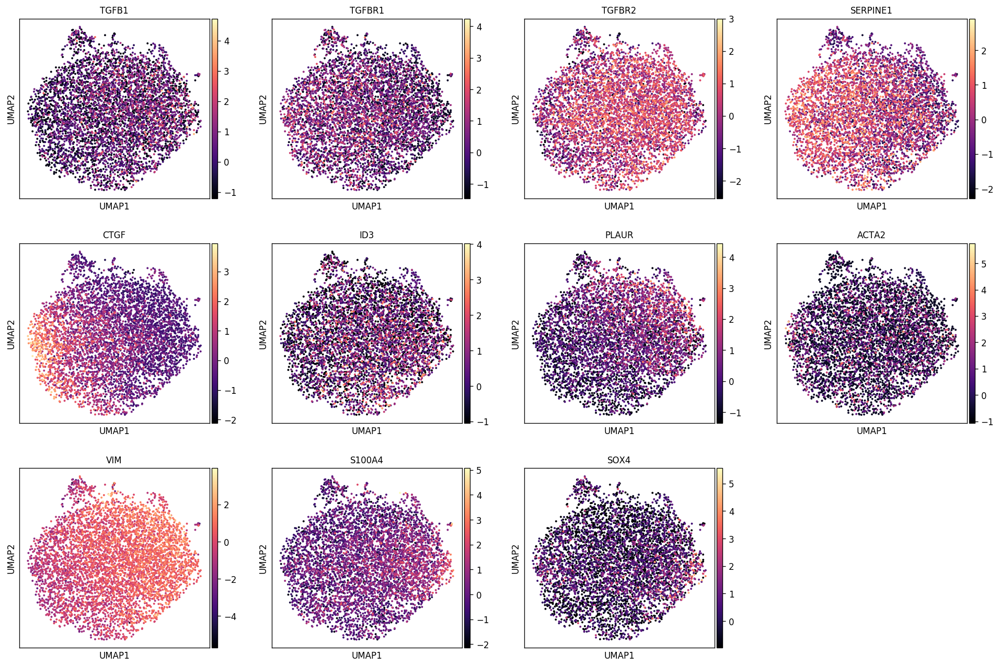

Finding marker genes in treated
Found the following marker genes: ['TGFB1', 'TGFBR1', 'TGFBR2', 'SERPINE1', 'CTGF', 'ID3', 'PLAUR', 'ACTA2', 'VIM', 'S100A4', 'SOX4'] , printing UMAP plots for these genes.


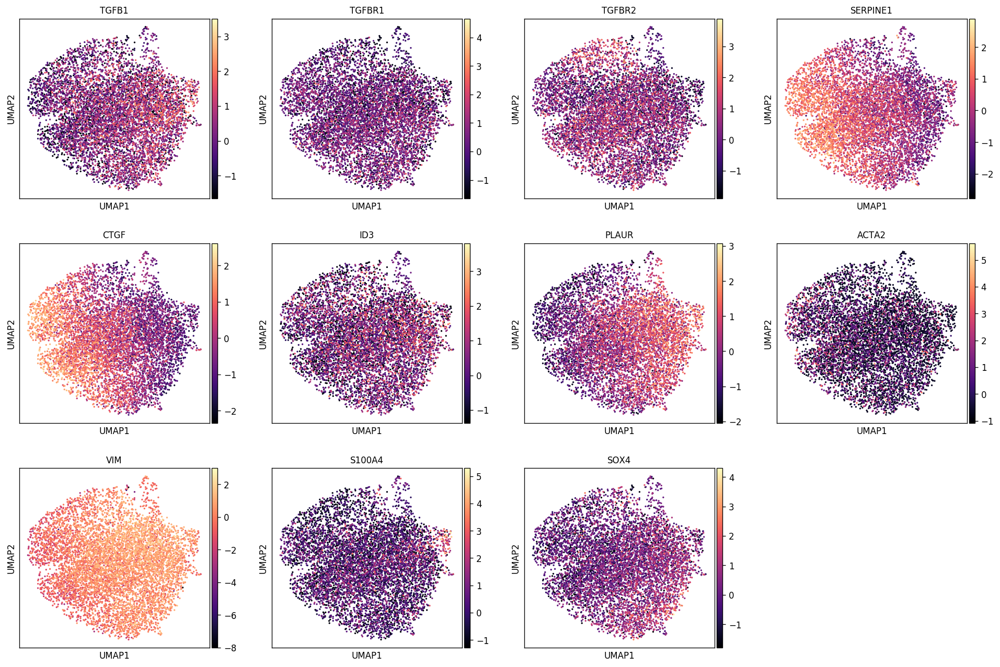

In [9]:
for batch, matrix in batches.items():
    print("Finding marker genes in", batch)
    filter_by = [var for var in MARKER_GENES if var in matrix.var_names]
    print("Found the following marker genes:", filter_by, ", printing UMAP plots for these genes.")
    sc.set_figure_params(scanpy=True, dpi=60, dpi_save=60, frameon=True, vector_friendly=True, fontsize=10, color_map=None, format='pdf', transparent=False, ipython_format='png2x')
    sc.pl.umap(matrix, color=filter_by, color_map=mpl.cm.magma)


## Clustering the neighborhood graph

The Louvain clustering method is an effective way to find communities in large networks (such as the neighborhood graph previously computed) through modularity optimizations. The original paper is [Blondel et al. (2008)](https://doi.org/10.1088/1742-5468/2008/10/P10008) and it has been proposed for single-cell analysis by [Levine et al. (2015)](https://doi.org/10.1016/j.cell.2015.05.047).

In [10]:
for batch, matrix in batches.items():
    print("Running Louvain clustering on", batch)
    sc.tl.louvain(matrix)

Running Louvain clustering on control
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.38) --> found 11 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)
Running Louvain clustering on treated
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.76) --> found 12 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)


We are expecting some of these clusters to highly correlate with the marker genes we named earlier for the S2 (treated) batch.

Plotting UMAP plot for Louvain clusters, as well as previous marker genes.
Found the following marker genes in batch control : ['TGFB1', 'TGFBR1', 'TGFBR2', 'SERPINE1', 'CTGF', 'ID3', 'PLAUR', 'ACTA2', 'VIM', 'S100A4', 'SOX4']
Printing UMAP plots comparing Louvain clusters to marker genes in batch control


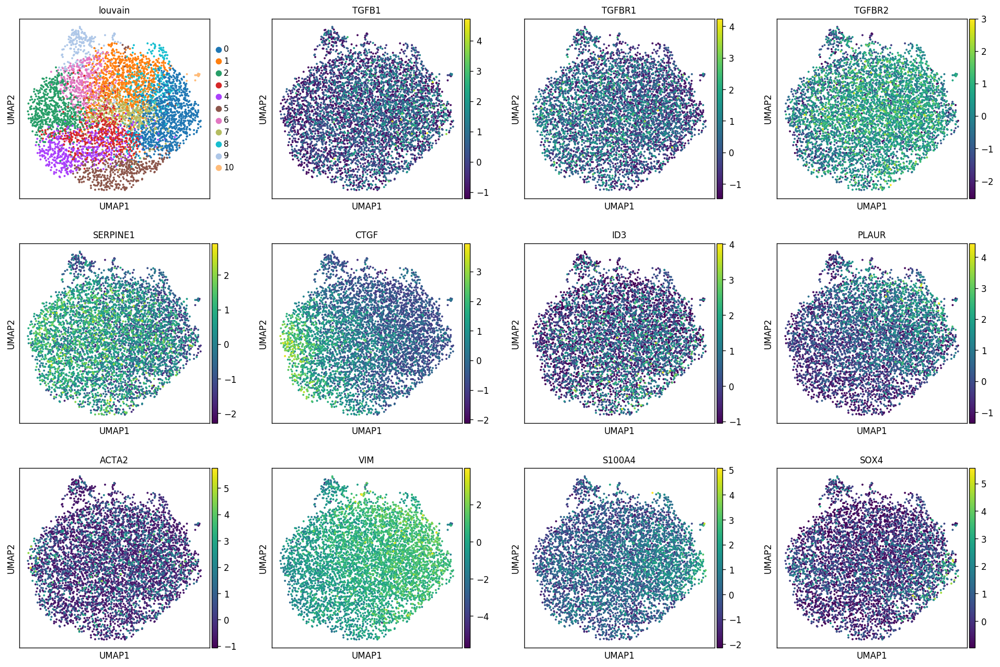

Plotting UMAP plot for Louvain clusters, as well as previous marker genes.
Found the following marker genes in batch treated : ['TGFB1', 'TGFBR1', 'TGFBR2', 'SERPINE1', 'CTGF', 'ID3', 'PLAUR', 'ACTA2', 'VIM', 'S100A4', 'SOX4']
Printing UMAP plots comparing Louvain clusters to marker genes in batch treated


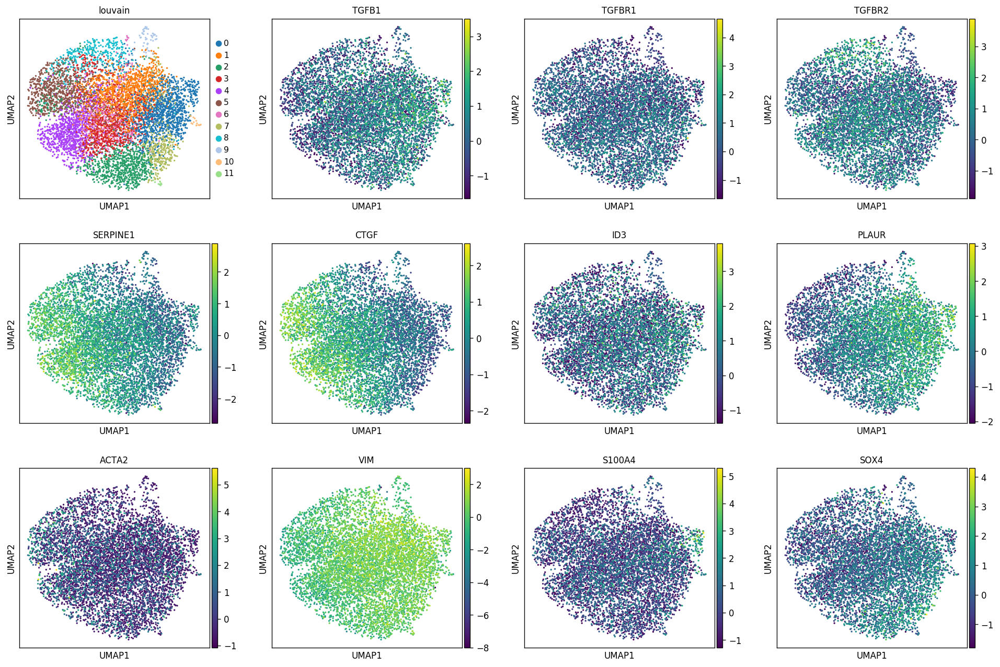

In [11]:
for batch, matrix in batches.items():
    print("Plotting UMAP plot for Louvain clusters, as well as previous marker genes.")
    filter_by = [var for var in MARKER_GENES if var in matrix.var_names]
    print("Found the following marker genes in batch", batch, ":", filter_by)
    filter_by.insert(0, "louvain")
    print("Printing UMAP plots comparing Louvain clusters to marker genes in batch", batch)
    sc.set_figure_params(scanpy=True, dpi=60, dpi_save=60, frameon=True, vector_friendly=True, fontsize=10, color_map=None, format='pdf', transparent=False, ipython_format='png2x')
    sc.pl.umap(matrix, color=filter_by)

Compute signatures and interesting genes across clusters

In [12]:
SIGNATURES = {"ALK5 signature": ["TRIB3", "CTGF", "FGF2", "SERPINE1", "NOX4", "TGFBR1"],
              "ALK1 signature": ["PLAUR", "KDELR3", "ID3","SCARA3","CYB561","ACVRL1"], "cVSMC signature" : ["ACTA2", "TAGLN", "CNN1", "MYOCDN", "SMTN"],"fibroblast signature": ["COL1A1", "S100A4", "VIM"],}

GENES_ACROSS_CLUSTERS = ("JARID2", "C7", "SOX4", "PLAUR", "SERPINE1", "ID3", "CTGF")

In [13]:
for key in SIGNATURES["ALK5 signature"]:
    try:
        batches["treated"][:,key]
        print(key, "ok")
    except IndexError:
        print(key, "bad")

TRIB3 ok
CTGF ok
FGF2 ok
SERPINE1 ok
NOX4 ok
TGFBR1 ok


In [14]:
log_rank_data = np.array([[random.randint(0, 10) for i in range(3)] for i in range(5)])

In [15]:
def scale_data_by_rank(data, reverse = False, is_logged = False):
    log = lambda a: a
    if is_logged:
        log = math.log
    global_result = []
    for row_no in range(data.shape[1]):
        ordering = sorted([(value, cell_index) for cell_index, value in enumerate(data.T[row_no])], reverse=(not reverse))
        rank = 1
        previous_expression = ordering[0][0]
        output_rank = [(1, ordering[0][1])]
        for expression, cell_index in ordering[1:]:
            current_rank = output_rank[-1][0]
            if expression != previous_expression:
                current_rank += 1
            output_rank.append((current_rank, cell_index))
            previous_expression = expression
        result = [log(j) for i, j in sorted([(j, i) for i, j in output_rank])]
        global_result.append(result)
    return np.vstack(global_result).T

In [16]:
log_rank_data

array([[7, 4, 0],
       [7, 0, 8],
       [2, 3, 2],
       [0, 7, 7],
       [2, 7, 1]])

In [17]:
scale_data_by_rank(log_rank_data, reverse=True, is_logged=True)

array([[1.09861229, 1.09861229, 0.        ],
       [1.09861229, 0.        , 1.60943791],
       [0.69314718, 0.69314718, 1.09861229],
       [0.        , 1.38629436, 1.38629436],
       [0.69314718, 1.38629436, 0.69314718]])

In [18]:
scale_data_by_rank(batches["treated"][:,SIGNATURES["ALK5 signature"]].X, reverse=True)

array([[5825, 2347, 1400, 1428, 2272, 6403],
       [5067,  412, 4194, 2545, 4519, 1328],
       [4469, 6993, 3593, 7390, 3624, 5696],
       ...,
       [3670,  630,  564,  229, 5489, 2648],
       [1969, 1408, 1499,  940, 5762, 3830],
       [3945, 2122, 1579, 1480,   58, 2311]])

Now working on batch control


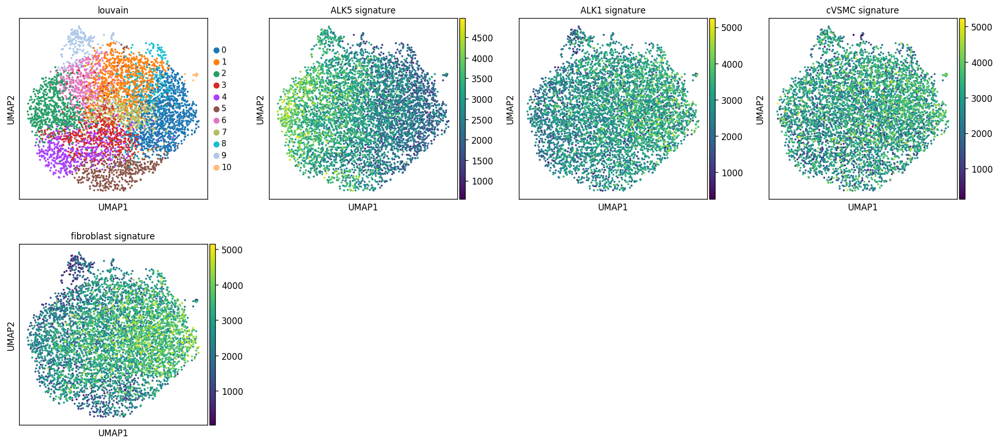

Now working on batch treated


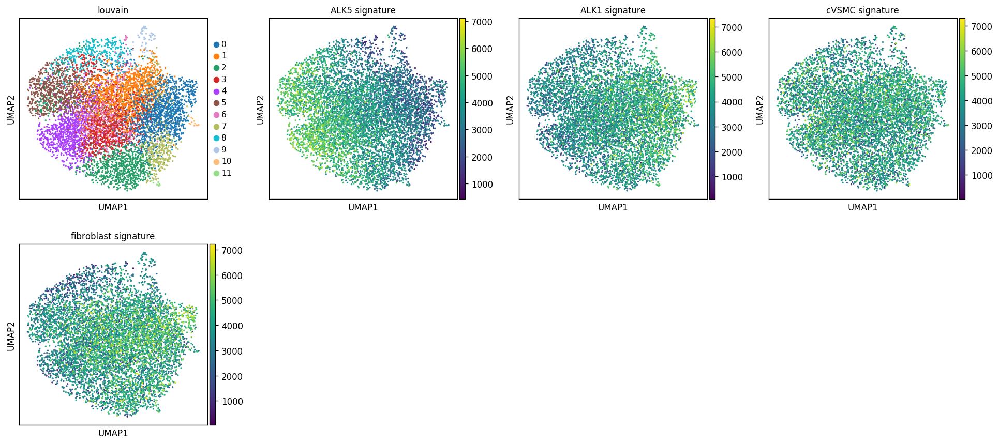

In [19]:
# TODO make sure that we actually know which genes crap out: `matrix.var.gene_names.isin(value)`
for batch, matrix in batches.items():
    print("Now working on batch", batch)
    for key, value in SIGNATURES.items():
        # Old signature:
        # matrix.obs[key] = matrix[:, matrix.var.gene_names.isin(value)].X.sum(1)
        new_matrix = scale_data_by_rank(matrix[:, matrix.var.gene_names.isin(value)].X, reverse=True, is_logged=False)
        matrix.obs[key] = new_matrix.sum(1)/new_matrix.shape[1]
    sc.pl.umap(matrix, color=['louvain'] + list(SIGNATURES.keys()))

Now working on batch control


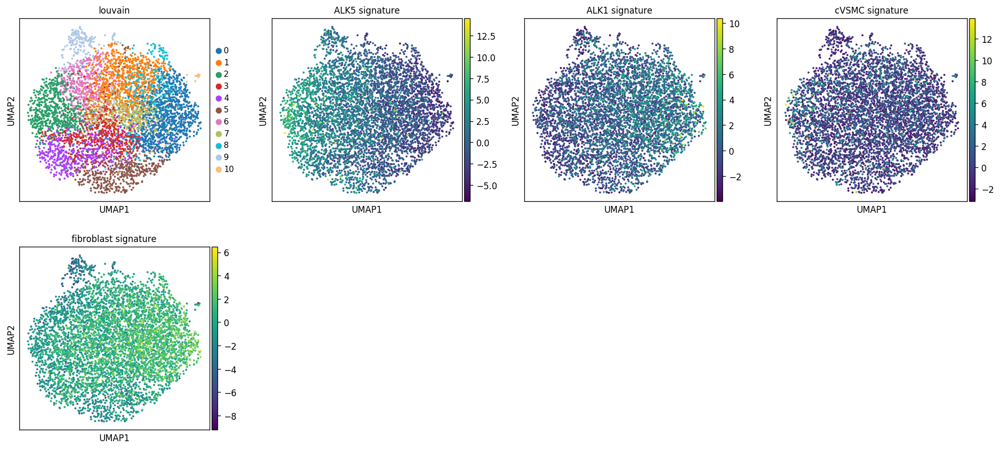

Now working on batch treated


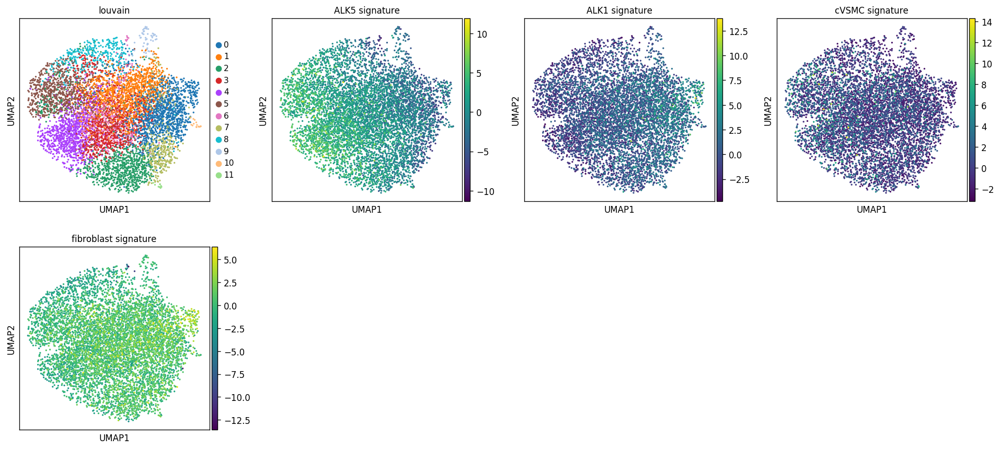

In [20]:
for batch, matrix in batches.items():
    print("Now working on batch", batch)
    for key, value in SIGNATURES.items():
        matrix.obs[key] = matrix[:, matrix.var.gene_names.isin(value)].X.sum(1)
    sc.pl.umap(matrix, color=['louvain'] + list(SIGNATURES.keys()))

Compute violin plots for signatures and genes above:

Now working on batch control
violin plot for signature ALK5 signature


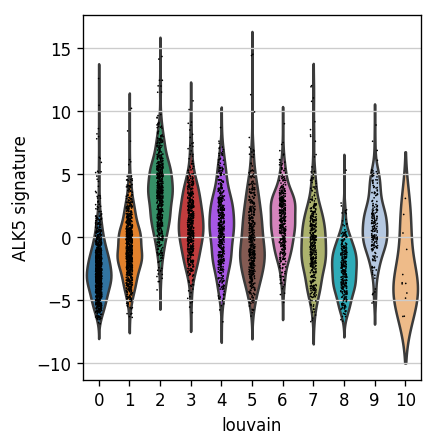

violin plot for signature ALK1 signature


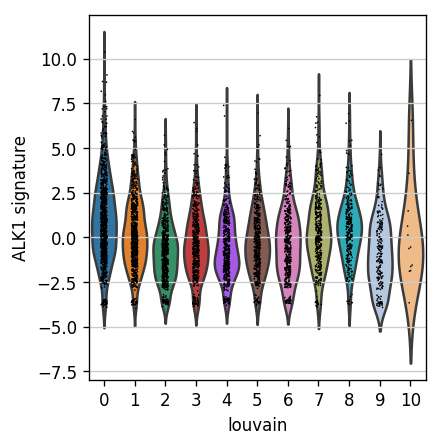

violin plot for signature cVSMC signature


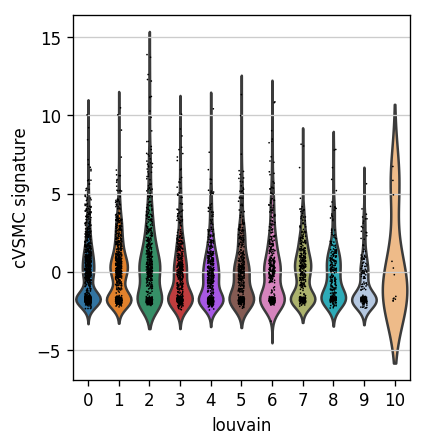

violin plot for signature fibroblast signature


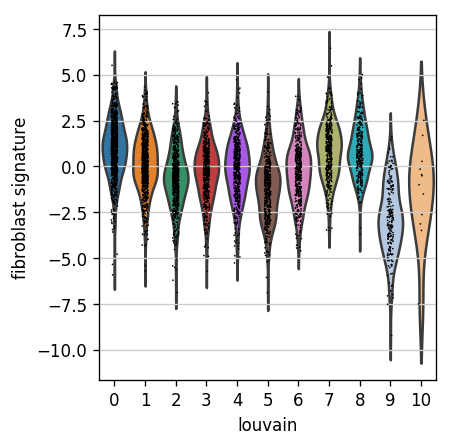

Now working on batch treated
violin plot for signature ALK5 signature


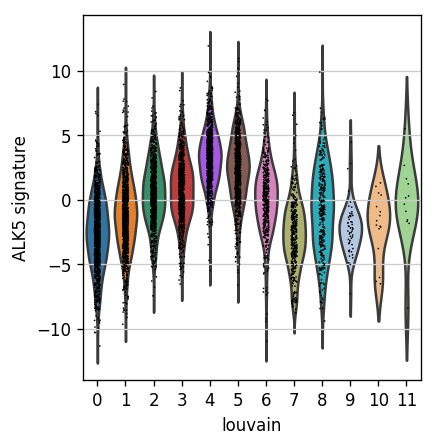

violin plot for signature ALK1 signature


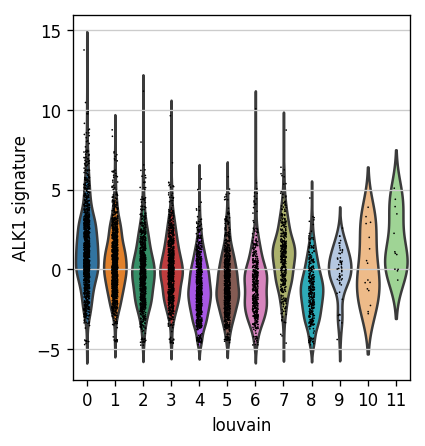

violin plot for signature cVSMC signature


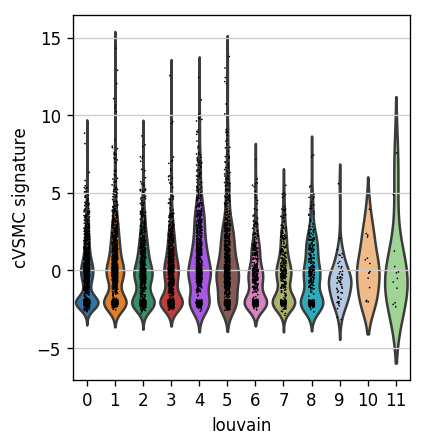

violin plot for signature fibroblast signature


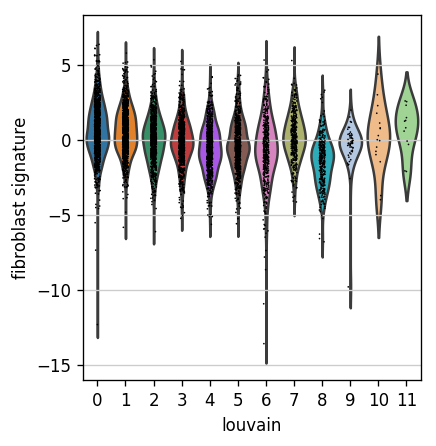

In [21]:
for batch, matrix in batches.items():
    print("Now working on batch", batch)
    for key, value in SIGNATURES.items():
        print("violin plot for signature", key)
        sc.pl.violin(matrix, [key], groupby='louvain')

Now working on batch control
plotting for JARID2 across clusters


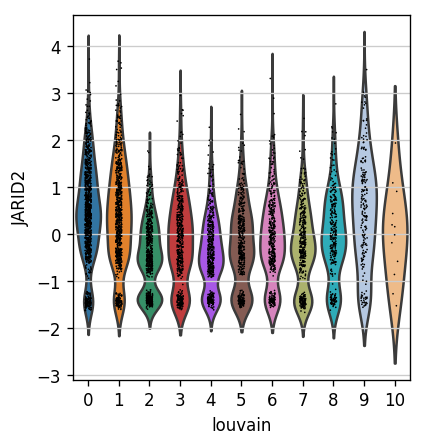

plotting for C7 across clusters


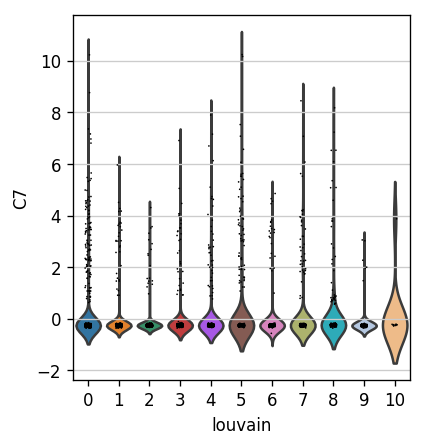

plotting for SOX4 across clusters


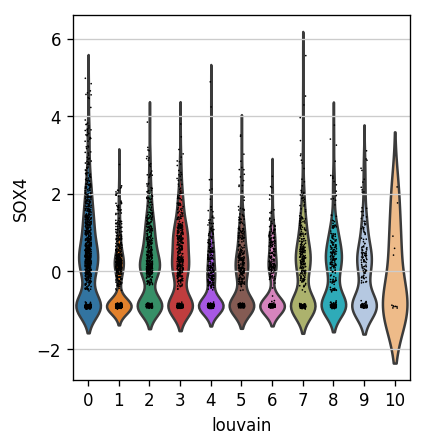

plotting for PLAUR across clusters


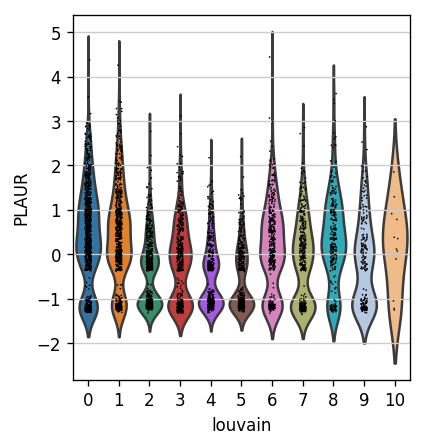

plotting for SERPINE1 across clusters


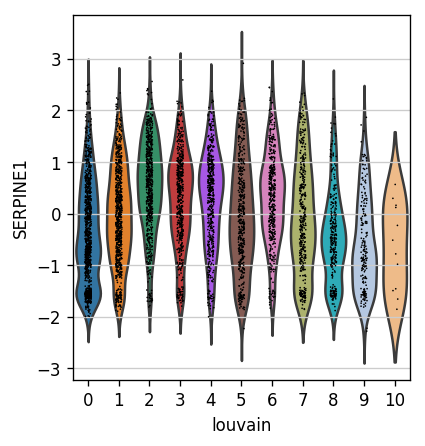

plotting for ID3 across clusters


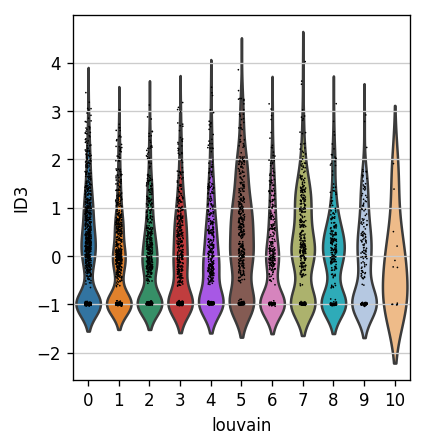

plotting for CTGF across clusters


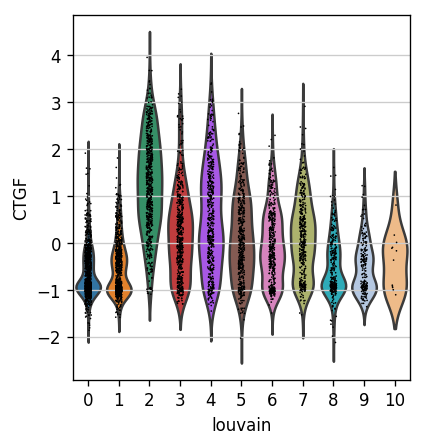

Now working on batch treated
plotting for JARID2 across clusters


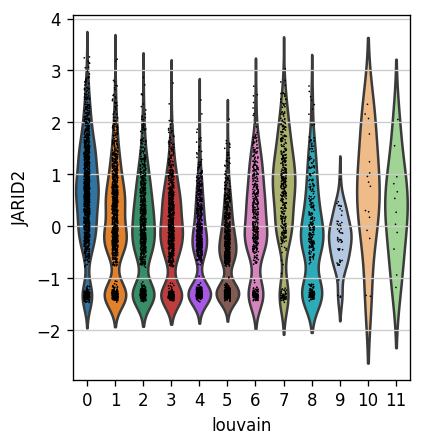

plotting for C7 across clusters


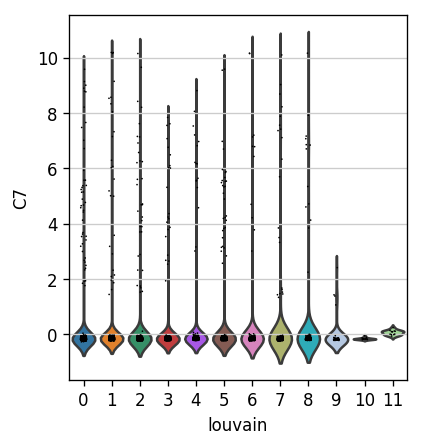

plotting for SOX4 across clusters


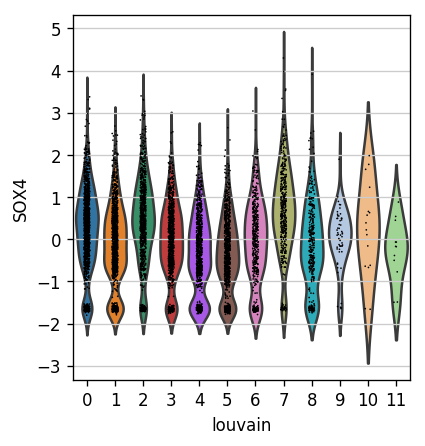

plotting for PLAUR across clusters


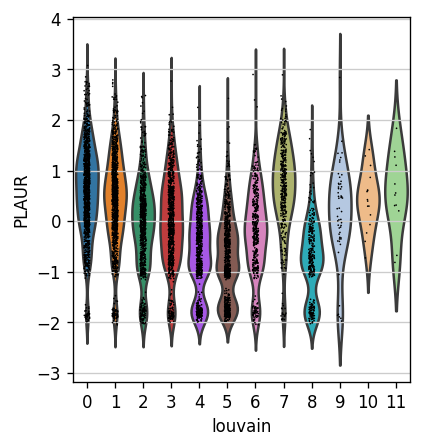

plotting for SERPINE1 across clusters


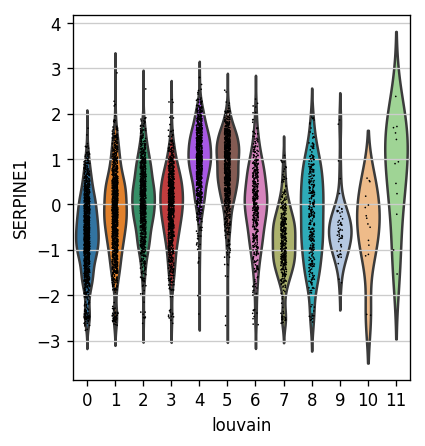

plotting for ID3 across clusters


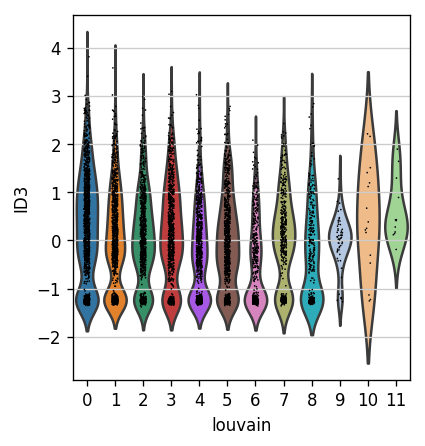

plotting for CTGF across clusters


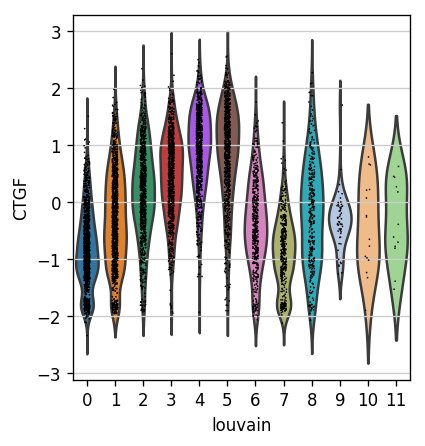

In [22]:
for batch, matrix in batches.items():
    print("Now working on batch", batch)
    
    for gene in GENES_ACROSS_CLUSTERS:
        try:
            print("plotting for", gene, "across clusters")
            sc.pl.violin(matrix, [gene], groupby='louvain')
        except:
            print("not found")

## FIGURE (for paper)
Louvain clusters and violin plots

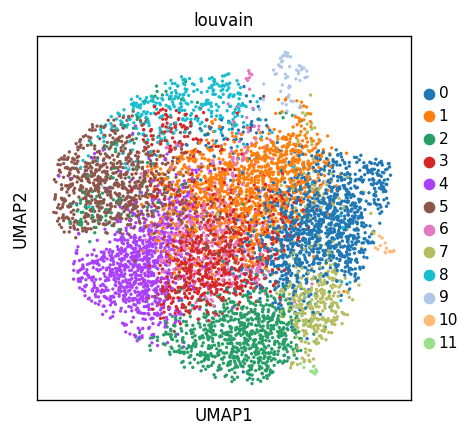

In [23]:
sc.set_figure_params(scanpy=True, dpi=60, dpi_save=60, frameon=True, vector_friendly=True, fontsize=10, color_map=None, format='pdf', transparent=False, ipython_format='png2x')
sc.pl.umap(batches["treated"], color="louvain")
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=150, frameon=True, vector_friendly=True, fontsize=10, color_map=None, format='pdf', transparent=False, ipython_format='png2x')

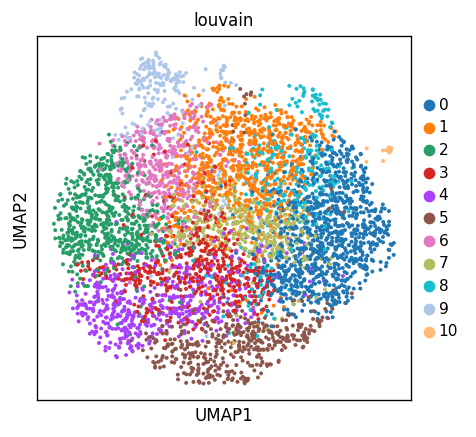

In [24]:
sc.set_figure_params(scanpy=True, dpi=60, dpi_save=60, frameon=True, vector_friendly=True, fontsize=10, color_map=None, format='pdf', transparent=False, ipython_format='png2x')
sc.pl.umap(batches["control"], color="louvain")
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=150, frameon=True, vector_friendly=True, fontsize=10, color_map=None, format='pdf', transparent=False, ipython_format='png2x')

In [25]:
SIGNATURES.keys()

dict_keys(['ALK5 signature', 'ALK1 signature', 'cVSMC signature', 'fibroblast signature'])

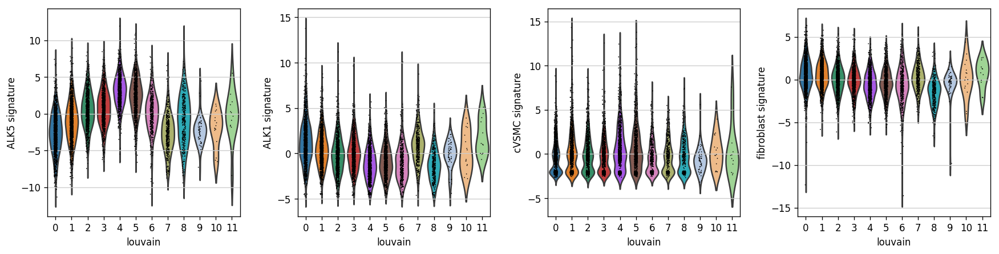

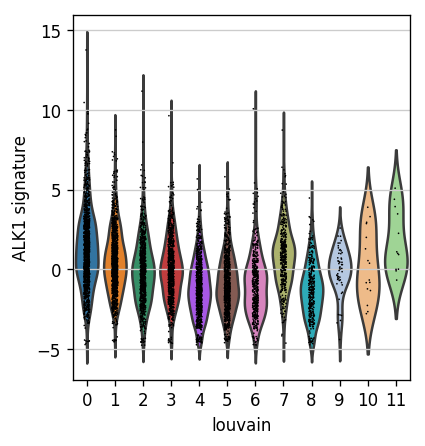

In [26]:
sc.set_figure_params(scanpy=True, dpi=60, dpi_save=60, frameon=True, vector_friendly=True, fontsize=10, color_map=None, format='pdf', transparent=False, ipython_format='png2x')
sc.pl.violin(batches["treated"], SIGNATURES.keys(), groupby='louvain')
sc.pl.violin(batches["treated"], "ALK1 signature", groupby='louvain')
sc.set_figure_params(scanpy=True, dpi=60, dpi_save=60, frameon=True, vector_friendly=True, fontsize=10, color_map=None, format='pdf', transparent=False, ipython_format='png2x')

In [27]:
for batch, matrix in batches.items():
    filename = "tgfb1-4-" + batch + ".h5ad"
    filename = os.path.join("write", filename)
    matrix.write(filename)

In [28]:
import scipy.stats

In [30]:
batch = "treated"
print(scipy.stats.spearmanr(batches[batch][:,"PLAUR"].X, batches[batch][:, "SERPINE1"].X))
batch = "control"
print(scipy.stats.spearmanr(batches[batch][:,"PLAUR"].X, batches[batch][:, "SERPINE1"].X))
batch = "control"
print(scipy.stats.spearmanr(batches[batch][:,"CTGF"].X, batches[batch][:, "SERPINE1"].X))

SpearmanrResult(correlation=-0.34261648453501586, pvalue=5.31319371070536e-204)
SpearmanrResult(correlation=-0.086493832896523, pvalue=2.371868232766835e-10)
SpearmanrResult(correlation=0.2696529842666493, pvalue=9.689898979072124e-90)


In [31]:
# Signatures we will print colored charts for.
SIGNATURES = {"Alk5 signature": ['SERPINE1', 'CTGF', 'SMAD7','COMP', 'NOX4', 'PMEPA1', 'RUNX1', 'PIGF', 'TAGLN', 'IL6', 'IL11', 'GJA4', 'LTBP1'],
              "Alk1 signature": ['ID1', 'ID2', 'ID3', 'ID4', 'HAMP', 'PLAUR', 'SMAD6', 'HMGA2', 'IL8', 'EDN1', 'CXCL1', 'BMP6', 'HO1', 'JAG1', 'PTHLH', 'TLR4', 'RHOB', 'MAP3K5', 'ENG', 'COL5A1', 'HSP47', 'DDIT3', 'DNAJB1', 'HERPUD1', 'NEDD9', 'CRYAB', 'TPM1', 'LENG4', 'KPNA3', 'ANKRD15', 'SQLE', 'KDELR3', 'SCARA3', 'STAT1', 'IL1R1'],
              "Fibroblast signature": ['S100A4', 'VIM', 'COL1A1', 'COL3A1', 'TSLP', 'CXCL14', 'SERPINH1'],
              "SMC signature": ['ACTA2', 'CNN1', 'TAGLN', 'MYL9', 'MYH11', 'TAGLN2', 'MYOCDN', 'SMTN', 'SMAO', 'DES', 'LMOD1', 'P2X1', 'CRP1', 'CRP2', 'VCL', 'CALM1', 'MYLK', 'PP1', 'MYPT1', 'PPP1R12A'],
              "Osteo signature": ['RUNX2', 'OSX', 'ALPL', 'BSP', 'BGLAP', 'COL1A1', 'MSX2', 'SOX9', 'SOX5', 'DLX5', 'PIT1', 'PIT2', 'SOST'],
              "Ca2+ signature": ["ITPR1", "ITPR2", "ITPR3", "RYR1", "RYR2", "RYR3", "ATP2A1", "ATP2A2", "ATP2A3"],
              "Apoptosis signature": ['CASP1', 'CASP2', 'CASP3', 'CASP4', 'CASP5', 'CASP6', 'CASP7', 'CASP8', 'CASP9', 'CASP10', 'CASP11', 'CASP12', 'CASP13', 'CASP14', 'TP53', 'BCL2']}

# Genes across clusters we will print charts for.
GENES_ACROSS_CLUSTERS = ("JARID2", "SOX4", "PLAUR", "SERPINE1", "ID3", "CTGF", "S100A4", "CNN3", "PLAUR", "SERPINE1", "ACTA2")

In [32]:
def pairwise_correlations_within_group(anndata_matrix, gene_list):
    print("shows in order correlation, pvalue, gene1, gene2")
    results = []
    
    filtered_signature = [gene for gene in gene_list if gene in anndata_matrix.var.index]
    wrong_gene_names = [gene for gene in gene_list if gene not in anndata_matrix.uns["genes_original"]]

    for i, gene1 in enumerate(filtered_signature):
        for j, gene2 in enumerate(filtered_signature[i+1:]):
            correlation = scipy.stats.spearmanr(anndata_matrix[:, [gene1]].X, anndata_matrix[:, [gene2]].X)
            results.append([correlation.correlation, correlation.pvalue, gene1, gene2])
    results.sort()
    for result in results:
        print(result)
    return results

In [33]:
def pairwise_correlations_across_groups(anndata_matrix, gene_list1, gene_list2):
    print("shows in order correlation, pvalue, gene1, gene2")
    results = []
    
    filtered_signature1 = [gene for gene in gene_list1 if gene in anndata_matrix.var.index]
    wrong_gene_names1 = [gene for gene in gene_list1 if gene not in anndata_matrix.uns["genes_original"]]

    filtered_signature2 = [gene for gene in gene_list2 if gene in anndata_matrix.var.index]
    wrong_gene_names2 = [gene for gene in gene_list2 if gene not in anndata_matrix.uns["genes_original"]]    

    for gene1 in filtered_signature1:
        for gene2 in filtered_signature2:
            correlation = scipy.stats.spearmanr(anndata_matrix[:, [gene1]].X, anndata_matrix[:, [gene2]].X)
            results.append([correlation.correlation, correlation.pvalue, gene1, gene2])
    results.sort()
    for result in results:
        print(result)
    return results

In [34]:
for batch in batches:
    print("Working for batch {}".format(batch))
    pairwise_correlations_within_group(batches[batch], SIGNATURES["Alk5 signature"])

Working for batch control
shows in order correlation, pvalue, gene1, gene2
[-0.2446719960154937, 9.993553508221684e-74, 'CTGF', 'LTBP1']
[-0.17715510432463724, 5.990423423370371e-39, 'NOX4', 'IL11']
[-0.13469772819603146, 4.4942211808306894e-23, 'CTGF', 'RUNX1']
[-0.13386213851121997, 8.328048875119483e-23, 'SERPINE1', 'LTBP1']
[-0.11509924418230076, 3.105524149990503e-17, 'PMEPA1', 'IL11']
[-0.10254419890607394, 5.629399760102229e-14, 'SERPINE1', 'RUNX1']
[-0.09808530963403565, 6.576139999856825e-13, 'CTGF', 'SMAD7']
[-0.0940677639785611, 5.493111156893145e-12, 'SMAD7', 'IL11']
[-0.09133150104330148, 2.218387204471207e-11, 'SERPINE1', 'NOX4']
[-0.08181808023433662, 2.079827263942274e-09, 'CTGF', 'NOX4']
[-0.07648883784218924, 2.1434613769627846e-08, 'IL6', 'LTBP1']
[-0.05839906612599361, 1.9288285544531144e-05, 'CTGF', 'PMEPA1']
[-0.05326715400636102, 9.742385384216882e-05, 'SERPINE1', 'SMAD7']
[-0.049108219491638155, 0.00032780095028215554, 'SERPINE1', 'PMEPA1']
[-0.04447594160342676

In [35]:
for batch in batches:
    print("Working for batch {}".format(batch))
    pairwise_correlations_across_groups(batches[batch], SIGNATURES["Alk1 signature"], SIGNATURES["Alk5 signature"])

Working for batch control
shows in order correlation, pvalue, gene1, gene2
[-0.6086192124564094, 0.0, 'CXCL1', 'NOX4']
[-0.439160403146562, 5.1661332813095886e-251, 'SMAD6', 'IL11']
[-0.41366038960255375, 3.9535645996134e-220, 'PTHLH', 'IL11']
[-0.40627681260934245, 1.125219135929566e-211, 'EDN1', 'IL11']
[-0.3174377914862719, 1.817345754217961e-125, 'MAP3K5', 'NOX4']
[-0.3164307725172131, 1.2145208850696976e-124, 'SCARA3', 'IL11']
[-0.3100003645176862, 1.893500823694566e-119, 'PTHLH', 'NOX4']
[-0.2651097006931255, 1.0732466011685952e-86, 'HMGA2', 'CTGF']
[-0.25116231107374215, 1.020106619166633e-77, 'TPM1', 'LTBP1']
[-0.23572391127509962, 2.044568122732984e-68, 'RHOB', 'IL11']
[-0.22596319189990718, 7.140985625593191e-63, 'PTHLH', 'TAGLN']
[-0.22557222618351155, 1.1759937907960159e-62, 'BMP6', 'IL11']
[-0.2149723472939903, 6.132421965079446e-57, 'SMAD6', 'TAGLN']
[-0.2082272671754499, 1.8612379736870961e-53, 'PLAUR', 'CTGF']
[-0.1972946250651189, 4.565362544891029e-48, 'CXCL1', 'PMEPA

[-0.40734403137282393, 1.8631262236704347e-295, 'CXCL1', 'NOX4']
[-0.34261648453501586, 5.31319371070536e-204, 'PLAUR', 'SERPINE1']
[-0.31783076325293547, 2.774405994636042e-174, 'HMGA2', 'CTGF']
[-0.3134124057091896, 2.8382797677647886e-169, 'PLAUR', 'CTGF']
[-0.24750168866403047, 2.8777038559092334e-104, 'MAP3K5', 'NOX4']
[-0.23419353767489168, 2.994879167095634e-93, 'HMGA2', 'SERPINE1']
[-0.21938846025044617, 8.732474623545814e-82, 'SCARA3', 'TAGLN']
[-0.2137853506592698, 1.1640861876984815e-77, 'SMAD6', 'TAGLN']
[-0.20531679205183503, 1.202499662555331e-71, 'PTHLH', 'TAGLN']
[-0.1567028909055893, 4.048094425766987e-42, 'ID1', 'TAGLN']
[-0.11818800249237164, 1.467290644938121e-24, 'TPM1', 'RUNX1']
[-0.11763729962492858, 2.4057525857079166e-24, 'TPM1', 'LTBP1']
[-0.10777894391573588, 1.1336426820528623e-20, 'IL1R1', 'SERPINE1']
[-0.10733710611859487, 1.6276160480367433e-20, 'HERPUD1', 'PMEPA1']
[-0.09739809950171398, 3.755413720608205e-17, 'ID4', 'SERPINE1']
[-0.09434738158625103, 3.

In [36]:
for batch in batches:
    print("Working for batch {}".format(batch))
    pairwise_correlations_within_group(batches[batch], SIGNATURES["Alk1 signature"])

Working for batch control
shows in order correlation, pvalue, gene1, gene2
[-0.46200028471747906, 5.1298149987370056e-281, 'PTHLH', 'NEDD9']
[-0.4436961524797532, 8.631624523379035e-257, 'SMAD6', 'NEDD9']
[-0.2685797988089287, 5.138162247004426e-89, 'NEDD9', 'SCARA3']
[-0.25803664573008833, 4.4933421607706714e-82, 'EDN1', 'NEDD9']
[-0.2379276167094605, 1.0546910917555794e-69, 'CXCL1', 'BMP6']
[-0.21507802662759526, 5.396528977117291e-57, 'MAP3K5', 'NEDD9']
[-0.21321030814825323, 5.1159478515822125e-56, 'HMGA2', 'STAT1']
[-0.15100438659391077, 1.2121985258373555e-28, 'RHOB', 'NEDD9']
[-0.146437605885924, 5.116068805217892e-27, 'HMGA2', 'TPM1']
[-0.14593763875416452, 7.651798718724513e-27, 'PLAUR', 'STAT1']
[-0.14267996062588473, 1.0183175074706153e-25, 'PLAUR', 'TPM1']
[-0.1369505114553389, 8.355295617701039e-24, 'CXCL1', 'RHOB']
[-0.13137839425757736, 5.091296015261313e-22, 'ID4', 'EDN1']
[-0.12414415409977637, 8.165841095383556e-20, 'HMGA2', 'COL5A1']
[-0.11539728331514114, 2.57178612

[-0.5881567019514921, 0.0, 'CXCL1', 'PTHLH']
[-0.5741158111813118, 0.0, 'CXCL1', 'SCARA3']
[-0.5446795585354899, 0.0, 'SMAD6', 'CXCL1']
[-0.4380131252714369, 0.0, 'SMAD6', 'MAP3K5']
[-0.4083331507017835, 5.0802843073526414e-297, 'EDN1', 'MAP3K5']
[-0.32301956189216985, 2.8186526469285217e-180, 'ID1', 'EDN1']
[-0.3135525695296561, 1.974408904537686e-169, 'ID4', 'MAP3K5']
[-0.2974806673761737, 6.551851383890609e-152, 'CXCL1', 'JAG1']
[-0.28922856589334767, 2.4323838071391355e-143, 'BMP6', 'MAP3K5']
[-0.27865638708322515, 8.938009420164927e-133, 'ID4', 'CXCL1']
[-0.2612423674728638, 2.2996402495191378e-116, 'MAP3K5', 'NEDD9']
[-0.260245791578721, 1.8367868229350181e-115, 'ID1', 'ID4']
[-0.25881001948503213, 3.60771183049263e-114, 'PLAUR', 'TPM1']
[-0.2440099115551501, 2.6047061445438823e-101, 'ID2', 'EDN1']
[-0.2314936462987188, 4.2541977758459225e-91, 'JAG1', 'MAP3K5']
[-0.2271579056684901, 1.0656402440809604e-87, 'PTHLH', 'RHOB']
[-0.22040263877205796, 1.5206988891550487e-82, 'EDN1', 'P